# «MP1 min100» Report

Report for the "manual_peak_1" (manual selected peak) dataset with config "min100" (all included labels have at least 100 samples).
This test includes only cnn 1d and 2d, each with image and hog features.

 - peak config: 50ms before and after
 - hog config: ??
 - spectrogram config: sampling_rate=500000, x_pixels_per_sec=2000, window='Ham'

K-Fold with K=8 for 1079+332+1457+1946+966+569+371+122+4275+183+143+218 samples, 8 bins of 15+15+15+15+15+15+15+15+15+15+15+15 and a remainder of 959+212+1337+1826+846+449+251+2+4155+63+23+98, for each fold: 11121 training, 180 validation, and 360 testing samples
 - val-bins: 1
 - test-bins: 2

## Results of the audio transforms (spectrograms)

'VS, all:1079, train:1034, val:15, test:30, reminder:959'

,A,B,C,D,E
0,,,,,
1,,,,,
2,,,,,
3,,,,,

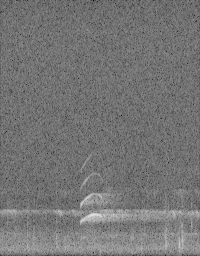
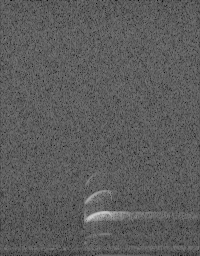
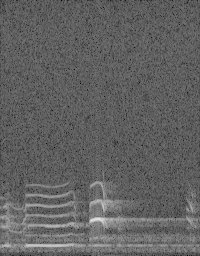
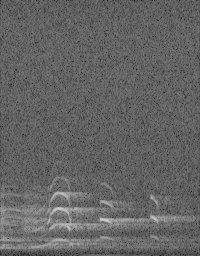
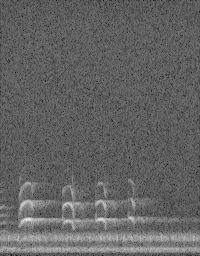
...
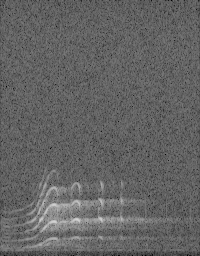
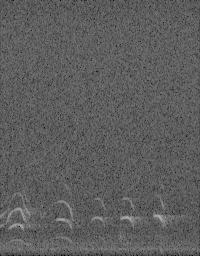
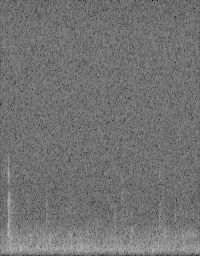
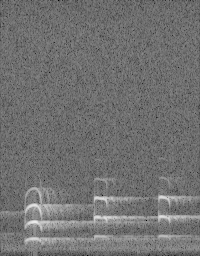
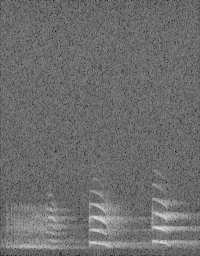

'VSV, all:332, train:287, val:15, test:30, reminder:212'

,A,B,C,D,E
0,,,,,
1,,,,,
2,,,,,
3,,,,,

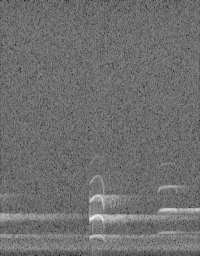
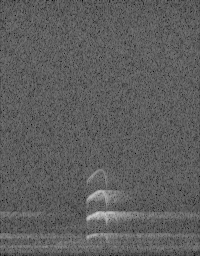
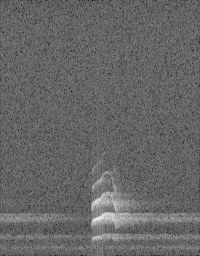
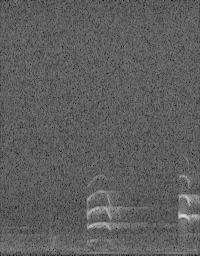
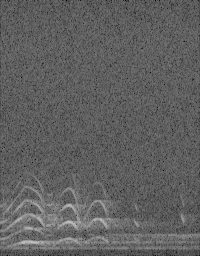
...
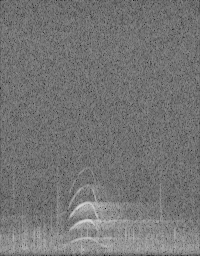
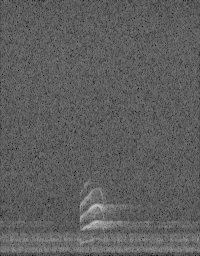
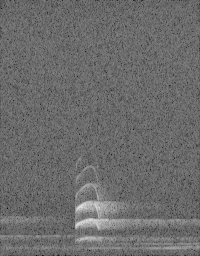
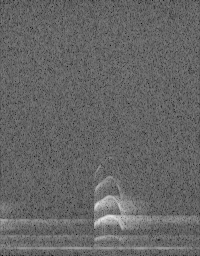
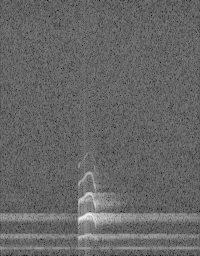

'ES, all:1457, train:1412, val:15, test:30, reminder:1337'

,A,B,C,D,E
0,,,,,
1,,,,,
2,,,,,
3,,,,,

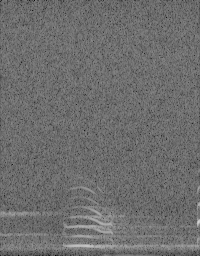
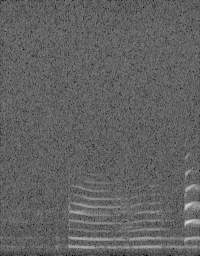
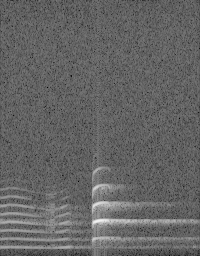
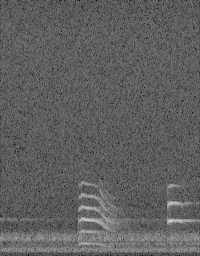
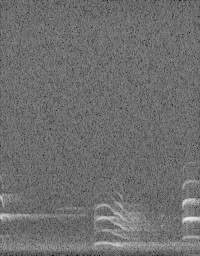
...
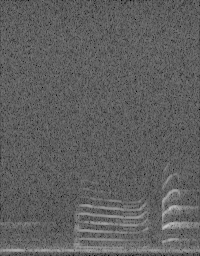
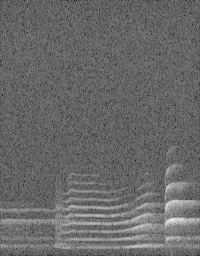
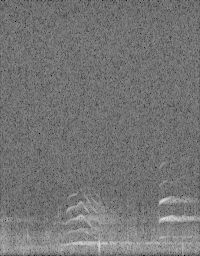
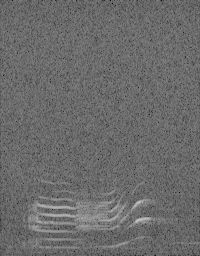
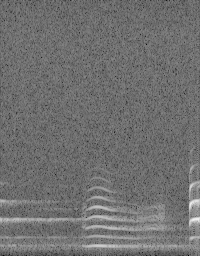

'SS, all:1946, train:1901, val:15, test:30, reminder:1826'

,A,B,C,D,E
0,,,,,
1,,,,,
2,,,,,
3,,,,,

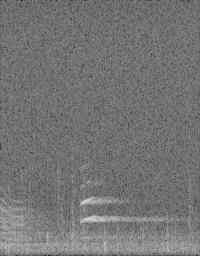
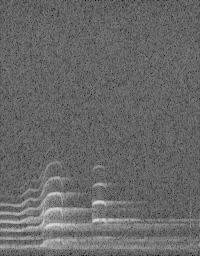
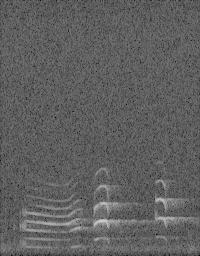
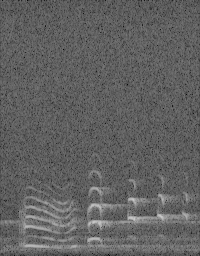
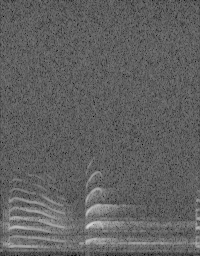
...
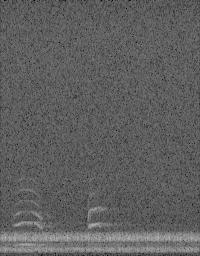
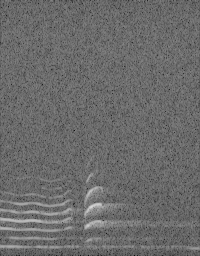
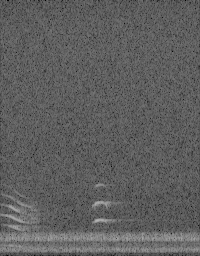
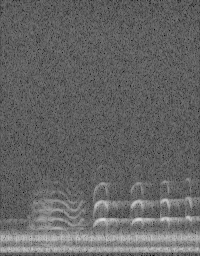
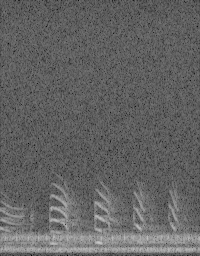

'C1, all:966, train:921, val:15, test:30, reminder:846'

,A,B,C,D,E
0,,,,,
1,,,,,
2,,,,,
3,,,,,

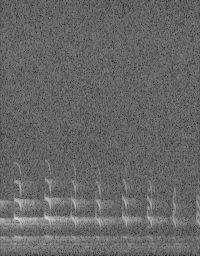
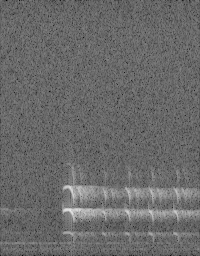
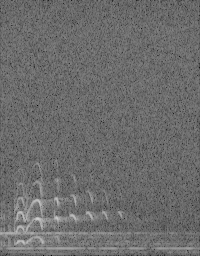
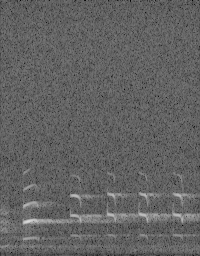
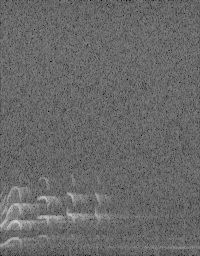
...
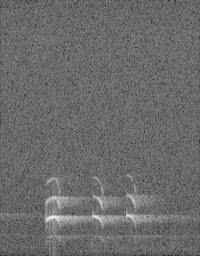
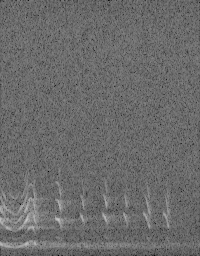
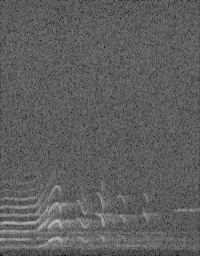
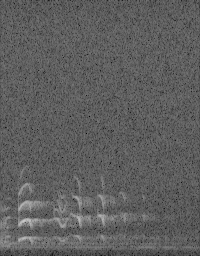
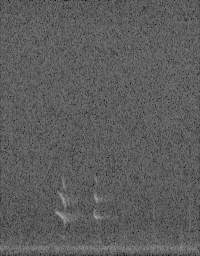

'I, all:569, train:524, val:15, test:30, reminder:449'

,A,B,C,D,E
0,,,,,
1,,,,,
2,,,,,
3,,,,,

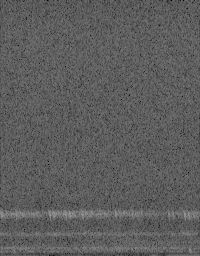
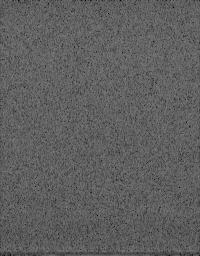
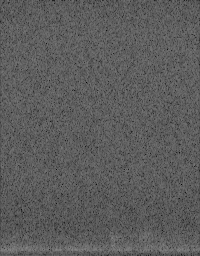
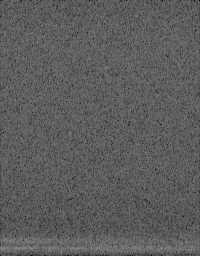
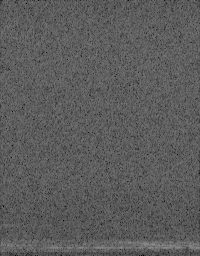
...
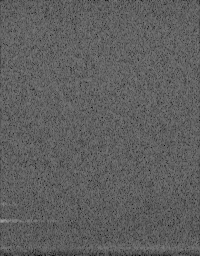
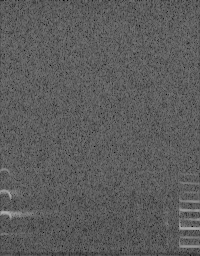
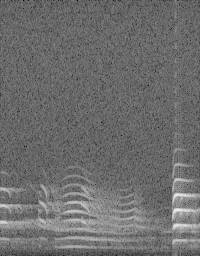
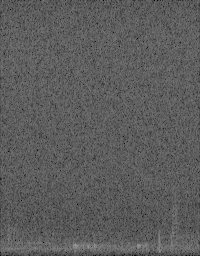
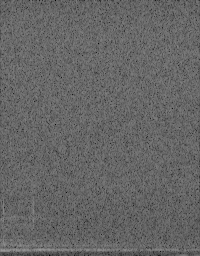

'EC, all:371, train:326, val:15, test:30, reminder:251'

,A,B,C,D,E
0,,,,,
1,,,,,
2,,,,,
3,,,,,

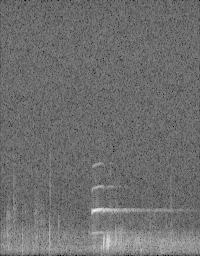
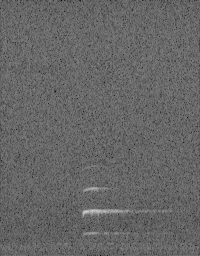
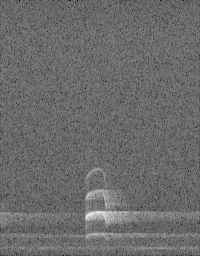
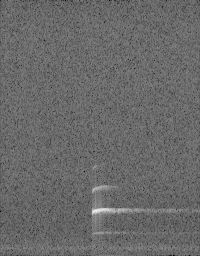
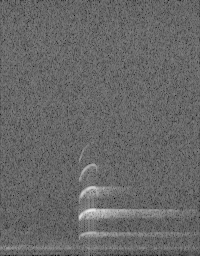
...
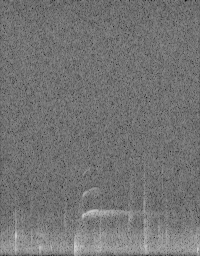
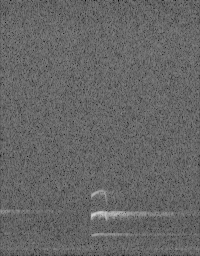
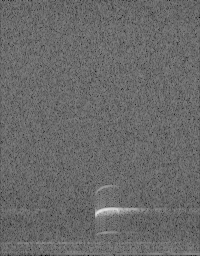
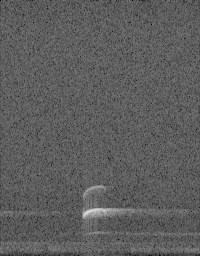
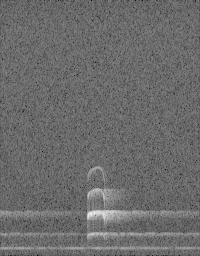

'ESS, all:122, train:77, val:15, test:30, reminder:2'

,A,B,C,D,E
0,,,,,
1,,,,,
2,,,,,
3,,,,,

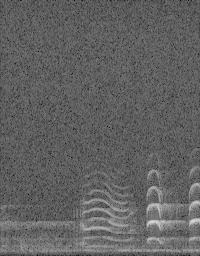
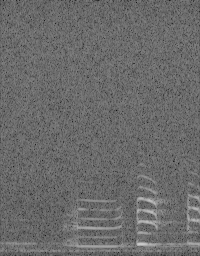
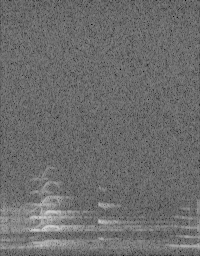
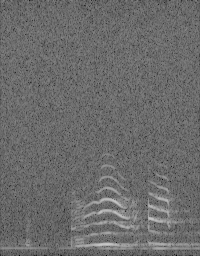
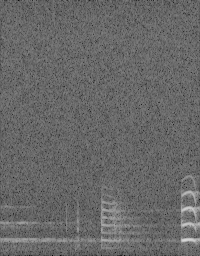
...
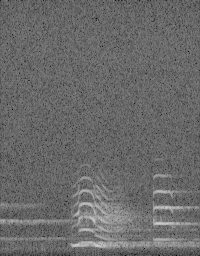
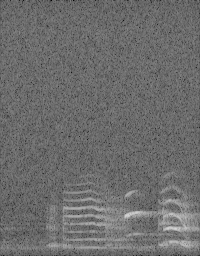
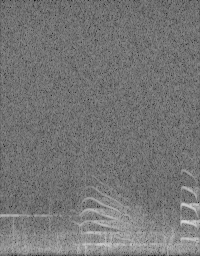
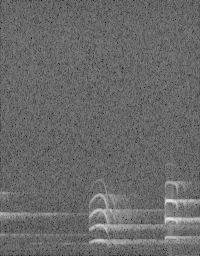
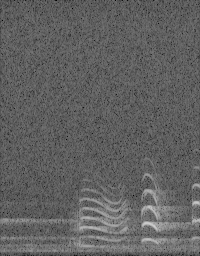

'T, all:4275, train:4230, val:15, test:30, reminder:4155'

,A,B,C,D,E
0,,,,,
1,,,,,
2,,,,,
3,,,,,

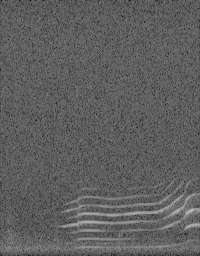
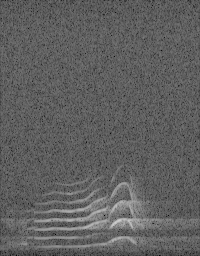
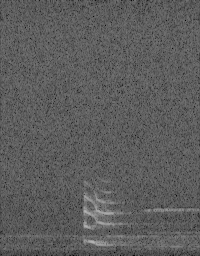
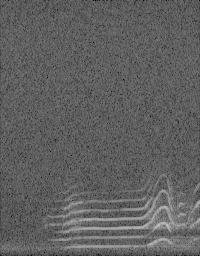
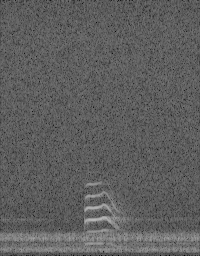
...
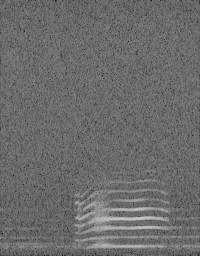
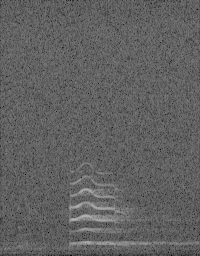
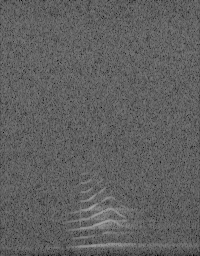
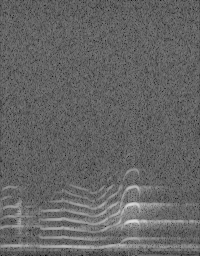
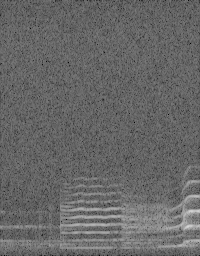

'V_BS, all:183, train:138, val:15, test:30, reminder:63'

,A,B,C,D,E
0,,,,,
1,,,,,
2,,,,,
3,,,,,

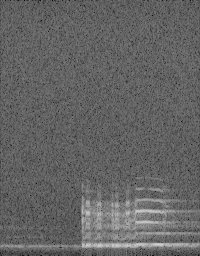
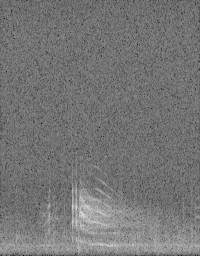
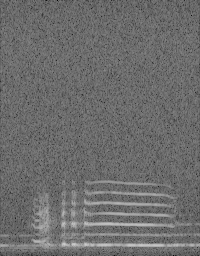
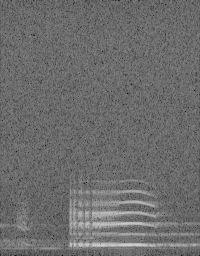
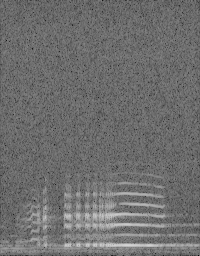
...
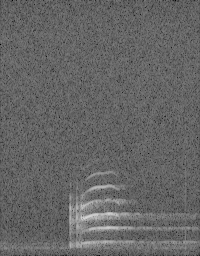
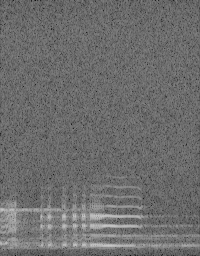
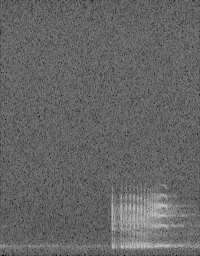
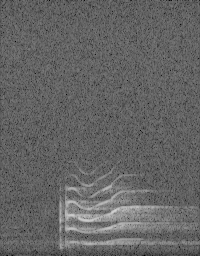
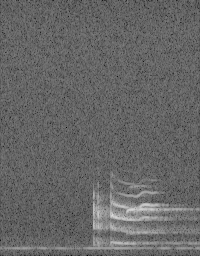

'V_W2, all:143, train:98, val:15, test:30, reminder:23'

,A,B,C,D,E
0,,,,,
1,,,,,
2,,,,,
3,,,,,

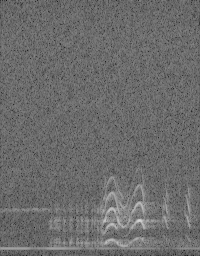
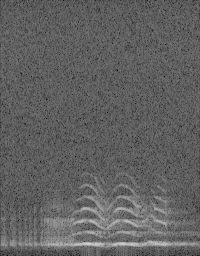
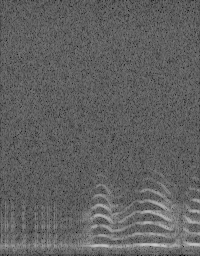
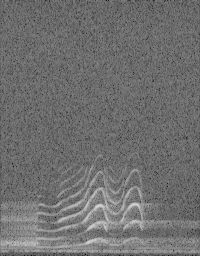
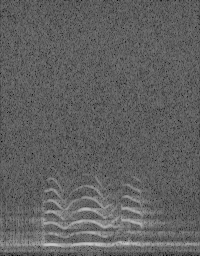
...
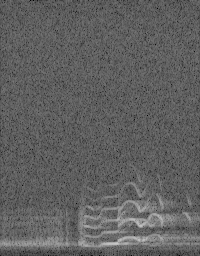
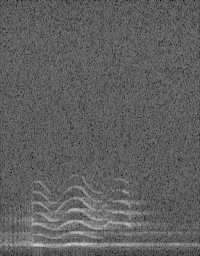
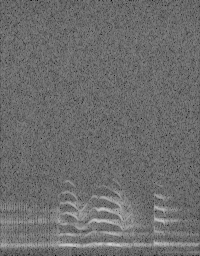
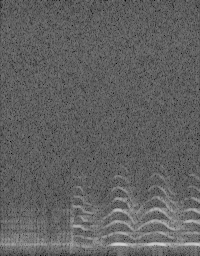
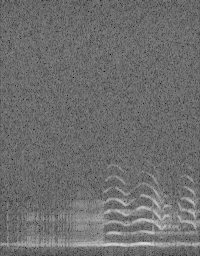

'CS, all:218, train:173, val:15, test:30, reminder:98'

,A,B,C,D,E
0,,,,,
1,,,,,
2,,,,,
3,,,,,

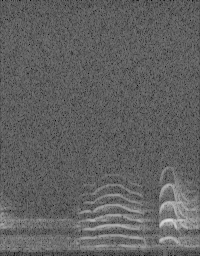
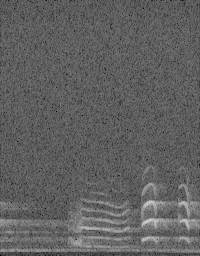
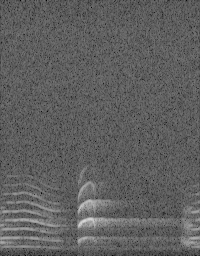
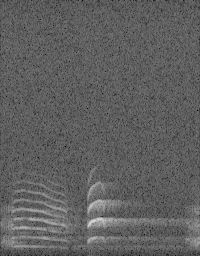
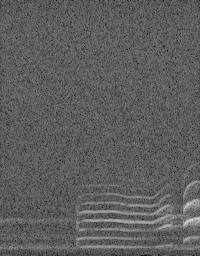
...
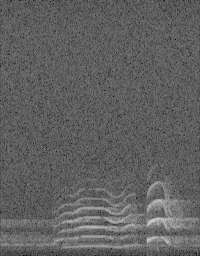
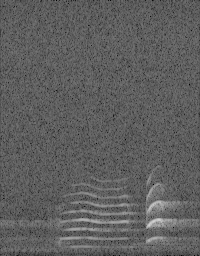
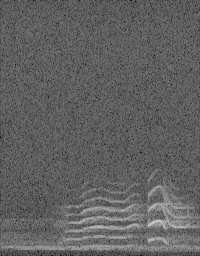
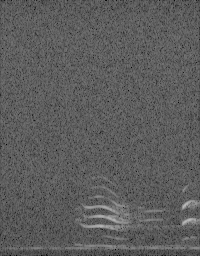
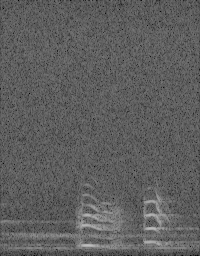

In [24]:
import json, itertools, glob, random, os
import pandas as pd
from IPython.display import display
from engine.settings import BSC_ROOT_DATA_FOLDER, MODELS_FOLDER
from engine.helpers import write_file, read_file
import base64
from IPython.display import Image, HTML
from utils.report import split_acc_loss_plots
from matplotlib import pyplot as plt
from pathlib import Path

imagePaths = glob.glob(str(BSC_ROOT_DATA_FOLDER / 'manual_peak_1' / 'audio' / 'peaks'/ 'sr500000_xpps2000_wHam') + '/*.png')
labels = ['VS', 'VSV', 'ES', 'SS', 'C1', 'I', 'EC', 'ESS', 'T', 'V_BS', 'V_W2', 'CS']

for label in labels:

	df = pd.DataFrame(columns=['A', 'B', 'C', 'D', 'E'])
	fImagePathes = list(filter(lambda imagePath: imagePath.find('_' +label+'_') != -1, imagePaths))
	all = len(fImagePathes)
	display(label + ', all:{0}, train:{1}, val:{2}, test:{3}, reminder:{4}'.format(all, all-(3*15), 15, 30, all-(8*15)))

	randomfImagePathes = random.sample(fImagePathes, 20)
	for row in range(4):
		images = ['<img title="{0:s}" src="data:image/png;base64,{1:s}">'.format(p[len(str(BSC_ROOT_DATA_FOLDER))+1:],base64.b64encode(Image(filename=p).data).decode()) for p in randomfImagePathes[row * 5:row * 5 + 5]]
		df.loc[row] = images
	display(HTML(df.to_html(escape=False)))

## Overview of the best Models

In [8]:
result_file = BSC_ROOT_DATA_FOLDER / 'results' / 'testing_mp1_min100.json'
results = json.loads(read_file(result_file))['results']

data = {}
keys = list(map("".join, itertools.product(*[['val', 'test'], ['_acc', '_loss'], ['_m', '_d']])))
for id in results:
	data[id] = {key: results[id][key] for key in keys}

pd.DataFrame().from_dict(data, orient="index")

,val_acc_m,val_acc_d,val_loss_m,val_loss_d,test_acc_m,test_acc_d,test_loss_m,test_loss_d
nn_cnn_2d_mp1_min100_raw_100\k-fold_4aba-c447-b473-1bb0-d073-b58e-35c7-d799\rec_k8_v1t2_e100_bva.report,0.785417,0.017043,3.888862,1.054601,0.761806,0.017925,0.815365,0.058071
nn_cnn_1d_mp1_min100_raw_100\k-fold_4aba-c447-b473-1bb0-d073-b58e-35c7-d799\rec_k8_v1t2_e100_bva.report,0.765278,0.030682,4.559383,2.211872,0.729514,0.028674,0.964698,0.154532
nn_cnn_2d_mp1_min100_hog_100\k-fold_29c9-54c9-3f65-587c-954e-b965-993c-eef1\rec_k8_v1t2_e100_bva.report,0.684028,0.022894,4.455366,1.020358,0.665625,0.020942,1.031446,0.077943
nn_cnn_1d_mp1_min100_hog_100\k-fold_29c9-54c9-3f65-587c-954e-b965-993c-eef1\rec_k8_v1t2_e100_bva.report,0.684028,0.022309,4.354237,0.862355,0.657986,0.026744,1.075046,0.083467
nn_cnn_2d_mp1_min100_hog_100_3d\k-fold_29c9-54c9-3f65-587c-954e-b965-993c-eef1\rec_k8_v1t2_e100_bva.report,0.642361,0.032792,5.375467,1.364104,0.613542,0.022588,1.178668,0.144664


## Statistics

- Error-plots train + valid
- Confusion matrix per report per result

'nn_cnn_2d_mp1_min100_raw_100\\1bb0a8cc54c21d5666e8f56b35f84b9edf5418ba\\epoch_100.h5.stats.json'

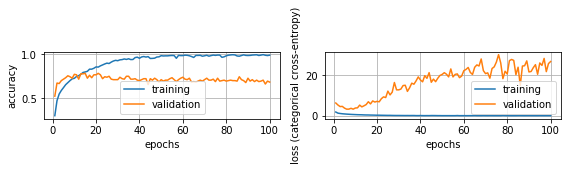

'nn_cnn_2d_mp1_min100_raw_100\\1bb0a8cc54c21d5666e8f56b35f84b9edf5418ba\\rec\\rec_e22aea0d77783187fdf3810d1e9c63da3eb4a42a_e15.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,27,0,0,0,0,0,0,0,2,0,0,1
CS,0,16,0,0,0,0,0,1,0,0,0,0
EC,0,0,29,0,0,1,0,0,5,2,0,0
ES,0,6,0,24,14,0,1,3,1,1,0,0
ESS,0,1,0,1,12,0,0,0,0,0,0,0
I,1,0,0,1,0,29,0,0,1,0,0,0
SS,0,3,0,1,1,0,28,0,5,0,0,2
T,0,3,0,2,0,0,0,19,1,3,6,5
VS,2,0,0,0,2,0,1,0,11,2,0,0
VSV,0,0,1,1,0,0,0,7,4,22,0,0


'nn_cnn_2d_mp1_min100_raw_100\\35c7bb8d4d2fbc6996c73443fecb0634dd4a3e2b\\epoch_100.h5.stats.json'

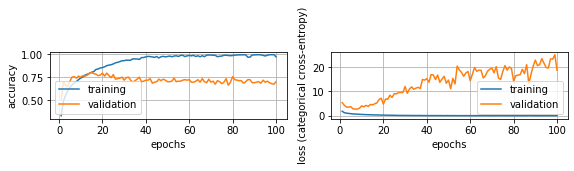

'nn_cnn_2d_mp1_min100_raw_100\\35c7bb8d4d2fbc6996c73443fecb0634dd4a3e2b\\rec\\rec_2aebf6656c2d4c28e47522b3d6f89103480a5f89_e15.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,26,0,0,0,0,0,0,0,3,0,0,0
CS,0,25,0,1,3,0,2,0,0,0,0,1
EC,1,0,29,0,0,0,0,1,4,3,0,0
ES,0,5,0,25,13,1,1,0,0,0,0,0
ESS,0,0,0,1,12,0,0,0,1,0,0,0
I,1,0,0,0,0,26,0,0,1,0,0,0
SS,0,0,0,0,0,0,25,1,3,1,0,0
T,1,0,0,3,0,2,0,22,2,1,6,2
VS,1,0,1,0,2,0,1,1,10,1,0,0
VSV,0,0,0,0,0,0,1,5,5,24,0,0


'nn_cnn_2d_mp1_min100_raw_100\\4abab2c8528124803b34c43362a55fe5f89400c9\\epoch_100.h5.stats.json'

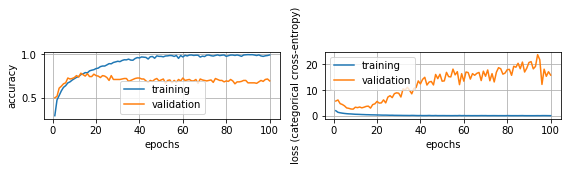

'nn_cnn_2d_mp1_min100_raw_100\\4abab2c8528124803b34c43362a55fe5f89400c9\\rec\\rec_c35c55d118f1d899845421dfbd5f5363559d2439_e13.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,24,0,0,0,0,0,0,0,2,2,0,0
CS,0,23,0,1,2,0,0,1,0,0,0,2
EC,0,0,28,0,0,0,1,0,2,1,0,0
ES,0,2,0,21,6,0,1,1,0,0,1,0
ESS,0,3,0,7,17,2,0,0,0,0,0,0
I,0,0,0,0,0,27,0,0,0,0,0,0
SS,0,0,0,0,1,0,26,0,0,0,0,0
T,0,2,0,1,2,0,0,24,4,1,4,2
VS,6,0,2,0,1,1,2,2,17,6,0,0
VSV,0,0,0,0,0,0,0,1,5,20,0,0


'nn_cnn_2d_mp1_min100_raw_100\\b473f02d9f8aa1e37d89631c731c442476b7fc4e\\epoch_100.h5.stats.json'

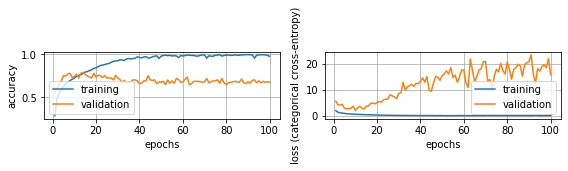

'nn_cnn_2d_mp1_min100_raw_100\\b473f02d9f8aa1e37d89631c731c442476b7fc4e\\rec\\rec_7c98dc25354798189d26a41313ed73db68f788ac_e14.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,26,0,0,0,0,0,0,0,2,0,0,0
CS,0,23,0,1,1,0,0,1,0,0,0,0
EC,0,0,26,0,0,1,0,0,1,1,0,0
ES,0,1,0,21,7,0,0,2,0,1,0,0
ESS,0,2,0,5,17,0,0,0,0,0,0,0
I,1,0,1,1,1,27,0,1,2,1,0,1
SS,0,1,0,0,2,0,27,0,4,0,0,0
T,0,1,0,1,0,0,0,17,2,2,1,4
VS,3,1,2,0,2,0,3,2,14,0,0,0
VSV,0,1,1,1,0,1,0,5,5,25,0,0


'nn_cnn_2d_mp1_min100_raw_100\\b58efc490582e7097ce61459f57ce3c8536945d4\\epoch_100.h5.stats.json'

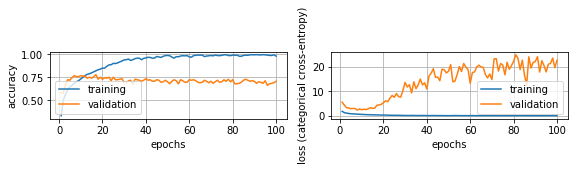

'nn_cnn_2d_mp1_min100_raw_100\\b58efc490582e7097ce61459f57ce3c8536945d4\\rec\\rec_c7d88e5fb608469120e3ce3ee5ae1b91210ffd60_e17.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,29,0,0,0,0,0,0,0,4,0,0,0
CS,0,22,0,0,1,0,0,0,1,0,0,0
EC,0,0,28,0,0,0,0,0,3,2,0,0
ES,0,5,0,27,17,2,1,2,1,0,0,0
ESS,0,0,0,1,10,0,0,0,0,0,0,0
I,0,0,0,0,0,27,0,0,0,0,0,0
SS,0,1,0,0,1,0,27,1,2,0,0,1
T,0,2,0,2,1,1,0,23,3,1,6,2
VS,1,0,2,0,0,0,1,3,13,8,0,1
VSV,0,0,0,0,0,0,1,1,3,19,0,0


'nn_cnn_2d_mp1_min100_raw_100\\c447ef35b77c2ef6c76e0347776d2df7d49cd3da\\epoch_100.h5.stats.json'

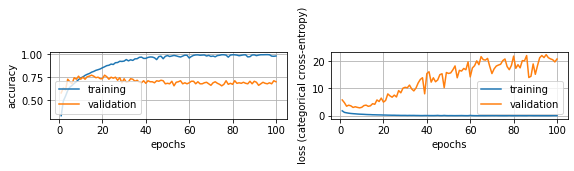

'nn_cnn_2d_mp1_min100_raw_100\\c447ef35b77c2ef6c76e0347776d2df7d49cd3da\\rec\\rec_63fbda633f1478df0aa14a75d5a4abc7ef03adc0_e15.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,28,0,0,0,0,0,0,0,3,1,0,0
CS,0,24,0,0,2,0,0,0,0,0,0,2
EC,0,0,25,0,0,0,0,0,2,0,0,0
ES,0,2,0,26,9,1,0,2,0,2,0,0
ESS,0,1,0,2,13,0,0,0,0,0,0,0
I,0,0,1,0,0,27,0,0,0,0,0,0
SS,0,0,0,0,1,0,29,0,2,0,0,1
T,0,1,0,2,2,1,0,25,3,1,1,10
VS,2,1,4,0,3,0,1,1,15,6,0,0
VSV,0,1,0,0,0,1,0,2,5,19,0,0


'nn_cnn_2d_mp1_min100_raw_100\\d073db8f56ab49f482c099e423bc943148de1886\\epoch_100.h5.stats.json'

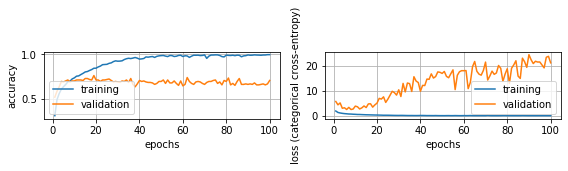

'nn_cnn_2d_mp1_min100_raw_100\\d073db8f56ab49f482c099e423bc943148de1886\\rec\\rec_8e2088da0993995ffbf847e1cd58d41ab641e92b_e19.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,28,0,0,0,0,0,0,0,3,0,0,1
CS,0,17,0,0,0,0,0,0,0,0,0,0
EC,0,0,28,0,0,0,0,0,2,1,0,0
ES,0,4,0,25,7,1,0,4,1,1,0,0
ESS,0,2,0,3,19,0,0,0,0,0,0,1
I,0,0,0,0,0,29,0,0,1,0,0,0
SS,0,3,0,0,1,0,29,1,2,0,1,1
T,0,3,0,2,0,0,0,22,2,1,3,3
VS,2,0,2,0,1,0,1,2,13,2,0,1
VSV,0,1,0,0,0,0,0,1,6,25,0,0


'nn_cnn_2d_mp1_min100_raw_100\\d799c10c307d279603620cfe6f65fc79fc14c615\\epoch_100.h5.stats.json'

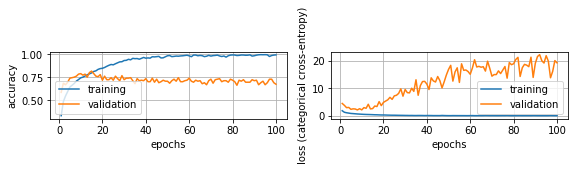

'nn_cnn_2d_mp1_min100_raw_100\\d799c10c307d279603620cfe6f65fc79fc14c615\\rec\\rec_d4f1b4b2196d818de2db3dfbd460e538ca9d777f_e15.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,26,0,0,0,0,0,0,0,2,3,0,0
CS,0,18,0,1,1,0,0,0,0,0,0,0
EC,0,0,30,0,0,0,1,1,4,3,0,0
ES,0,1,0,16,6,0,0,0,0,0,0,0
ESS,0,3,0,11,17,1,0,1,0,0,1,0
I,0,0,0,0,0,27,0,0,0,0,0,0
SS,0,1,0,0,1,0,27,0,2,1,0,0
T,1,7,0,2,3,1,0,22,2,1,4,2
VS,3,0,0,0,1,1,1,2,12,2,0,0
VSV,0,0,0,0,1,0,1,3,6,20,0,0


'nn_cnn_1d_mp1_min100_raw_100\\1bb0a8cc54c21d5666e8f56b35f84b9edf5418ba\\epoch_100.h5.stats.json'

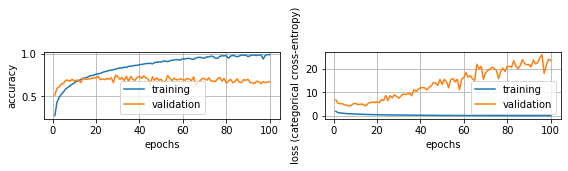

'nn_cnn_1d_mp1_min100_raw_100\\1bb0a8cc54c21d5666e8f56b35f84b9edf5418ba\\rec\\rec_e22aea0d77783187fdf3810d1e9c63da3eb4a42a_e29.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,26,0,0,0,0,0,0,0,0,0,0,1
CS,0,19,0,0,2,0,0,1,0,0,0,0
EC,0,0,26,0,0,1,0,0,0,1,0,0
ES,0,6,0,22,10,0,0,1,1,1,0,0
ESS,0,0,0,3,12,0,0,1,0,0,0,0
I,1,0,1,1,0,29,0,0,2,0,0,1
SS,0,3,0,0,2,0,29,1,5,3,1,1
T,0,1,0,3,1,0,0,20,1,0,6,4
VS,2,0,1,1,2,0,0,2,15,4,0,0
VSV,1,1,2,0,0,0,1,2,5,20,0,0


'nn_cnn_1d_mp1_min100_raw_100\\35c7bb8d4d2fbc6996c73443fecb0634dd4a3e2b\\epoch_100.h5.stats.json'

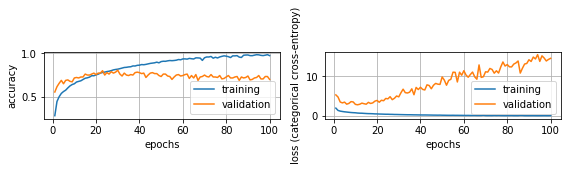

'nn_cnn_1d_mp1_min100_raw_100\\35c7bb8d4d2fbc6996c73443fecb0634dd4a3e2b\\rec\\rec_2aebf6656c2d4c28e47522b3d6f89103480a5f89_e30.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,27,0,0,0,1,0,1,0,4,1,0,0
CS,0,27,0,2,2,0,0,0,0,0,0,0
EC,0,0,28,0,0,0,1,0,6,2,0,0
ES,0,3,0,23,13,1,1,1,1,0,1,0
ESS,0,0,0,2,11,0,0,0,1,0,0,0
I,0,0,0,0,0,26,0,0,1,1,0,0
SS,0,0,1,0,1,1,25,0,4,0,1,0
T,1,0,0,3,1,1,0,22,1,0,8,2
VS,2,0,1,0,1,1,1,2,9,4,0,0
VSV,0,0,0,0,0,0,1,5,3,22,0,0


'nn_cnn_1d_mp1_min100_raw_100\\4abab2c8528124803b34c43362a55fe5f89400c9\\epoch_100.h5.stats.json'

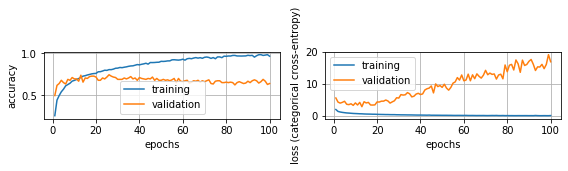

'nn_cnn_1d_mp1_min100_raw_100\\4abab2c8528124803b34c43362a55fe5f89400c9\\rec\\rec_c35c55d118f1d899845421dfbd5f5363559d2439_e26.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,23,0,1,0,0,1,0,0,2,3,0,0
CS,0,21,0,0,8,0,1,1,1,1,0,1
EC,2,0,26,0,0,0,1,0,2,0,0,0
ES,0,4,0,25,5,0,0,0,1,0,0,0
ESS,0,3,0,3,13,1,0,1,0,0,0,0
I,0,0,0,0,0,27,0,0,0,0,0,0
SS,0,0,0,0,1,0,23,0,1,0,0,0
T,0,2,0,2,3,0,1,24,6,3,10,5
VS,5,0,2,0,0,1,3,1,8,4,0,0
VSV,0,0,0,0,0,0,1,2,9,19,0,0


'nn_cnn_1d_mp1_min100_raw_100\\b473f02d9f8aa1e37d89631c731c442476b7fc4e\\epoch_100.h5.stats.json'

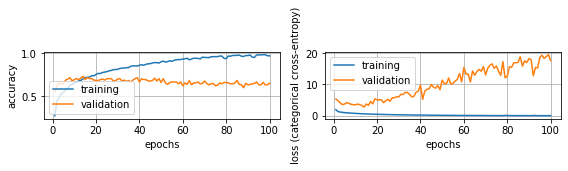

'nn_cnn_1d_mp1_min100_raw_100\\b473f02d9f8aa1e37d89631c731c442476b7fc4e\\rec\\rec_7c98dc25354798189d26a41313ed73db68f788ac_e14.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,25,0,0,0,0,0,0,0,0,0,0,0
CS,0,22,0,3,1,0,0,0,0,0,0,1
EC,0,0,28,0,0,1,0,0,0,1,0,0
ES,0,1,0,8,6,0,1,2,0,2,0,0
ESS,0,3,0,17,15,0,0,2,0,1,0,3
I,1,0,1,1,1,27,0,0,2,0,0,1
SS,0,1,0,0,2,0,26,0,5,0,0,0
T,0,0,0,0,1,1,0,14,1,1,4,3
VS,3,1,1,0,3,0,1,0,14,1,0,0
VSV,1,2,0,0,0,0,2,6,8,24,1,0


'nn_cnn_1d_mp1_min100_raw_100\\b58efc490582e7097ce61459f57ce3c8536945d4\\epoch_100.h5.stats.json'

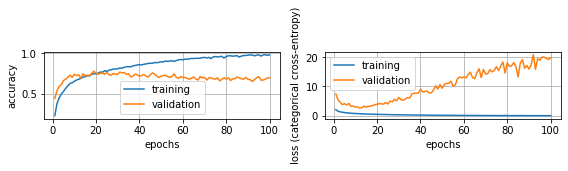

'nn_cnn_1d_mp1_min100_raw_100\\b58efc490582e7097ce61459f57ce3c8536945d4\\rec\\rec_c7d88e5fb608469120e3ce3ee5ae1b91210ffd60_e19.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,30,0,1,0,0,2,0,0,4,0,0,0
CS,0,21,0,2,1,0,0,0,0,1,0,1
EC,0,0,27,0,0,0,0,0,4,1,0,0
ES,0,5,0,24,11,2,0,2,0,0,0,0
ESS,0,0,0,0,16,0,0,0,1,0,0,0
I,0,0,0,0,0,24,0,0,0,0,0,0
SS,0,1,0,0,1,0,28,1,2,0,0,0
T,0,1,2,4,0,1,0,17,1,1,0,1
VS,0,0,0,0,0,1,2,3,9,2,0,1
VSV,0,0,0,0,0,0,0,2,7,24,0,0


'nn_cnn_1d_mp1_min100_raw_100\\c447ef35b77c2ef6c76e0347776d2df7d49cd3da\\epoch_100.h5.stats.json'

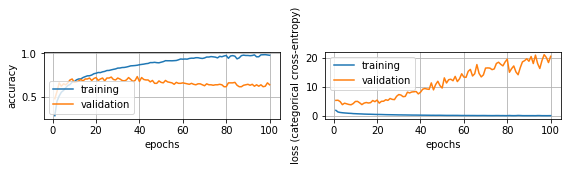

'nn_cnn_1d_mp1_min100_raw_100\\c447ef35b77c2ef6c76e0347776d2df7d49cd3da\\rec\\rec_63fbda633f1478df0aa14a75d5a4abc7ef03adc0_e39.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,26,0,0,0,0,0,0,0,3,1,1,0
CS,0,17,0,1,1,0,0,0,1,0,0,0
EC,1,0,27,0,0,0,0,0,2,1,0,0
ES,0,6,0,24,11,2,0,2,0,2,0,0
ESS,0,2,0,3,12,0,0,0,0,0,0,0
I,0,0,1,0,2,27,0,0,1,0,0,0
SS,0,0,0,0,1,0,29,0,4,0,0,1
T,0,3,0,2,1,1,1,25,3,5,2,13
VS,3,1,2,0,2,0,0,1,13,2,0,0
VSV,0,1,0,0,0,0,0,2,3,19,0,0


'nn_cnn_1d_mp1_min100_raw_100\\d073db8f56ab49f482c099e423bc943148de1886\\epoch_100.h5.stats.json'

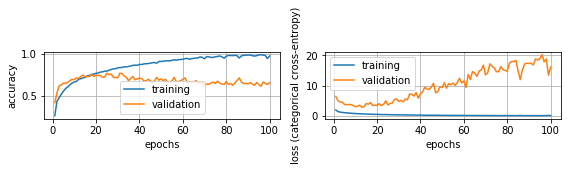

'nn_cnn_1d_mp1_min100_raw_100\\d073db8f56ab49f482c099e423bc943148de1886\\rec\\rec_8e2088da0993995ffbf847e1cd58d41ab641e92b_e25.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,28,0,0,0,0,0,0,0,3,0,0,0
CS,0,21,0,1,4,0,0,1,0,0,0,1
EC,0,0,27,0,0,0,0,0,2,0,0,0
ES,0,2,0,21,9,1,0,0,1,1,0,0
ESS,0,0,0,2,13,0,0,1,0,0,0,0
I,0,0,0,0,0,28,0,0,1,0,0,0
SS,0,2,0,0,1,0,27,2,3,0,0,0
T,0,1,1,6,2,1,1,20,2,0,3,2
VS,2,0,0,0,1,0,1,2,12,1,0,1
VSV,0,1,2,0,0,0,1,4,6,27,0,0


'nn_cnn_1d_mp1_min100_raw_100\\d799c10c307d279603620cfe6f65fc79fc14c615\\epoch_100.h5.stats.json'

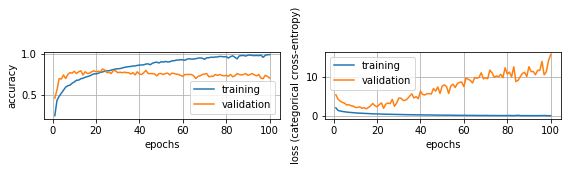

'nn_cnn_1d_mp1_min100_raw_100\\d799c10c307d279603620cfe6f65fc79fc14c615\\rec\\rec_d4f1b4b2196d818de2db3dfbd460e538ca9d777f_e23.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,27,0,1,0,1,0,1,0,5,3,0,0
CS,0,21,0,1,4,0,0,0,0,0,0,0
EC,0,0,28,0,0,0,2,0,4,2,0,0
ES,0,2,0,17,4,0,0,0,0,0,0,0
ESS,0,2,0,9,13,1,0,0,1,0,1,0
I,0,0,0,0,0,25,0,0,0,0,0,0
SS,0,0,0,0,1,1,20,0,2,0,0,0
T,1,5,1,3,4,0,0,27,3,3,4,4
VS,2,0,0,0,1,3,6,2,9,4,0,0
VSV,0,0,0,0,1,0,1,1,6,16,0,0


'nn_cnn_2d_mp1_min100_hog_100\\29c964743e29eb5d1192a6b7593c0d5227312967\\epoch_100.h5.stats.json'

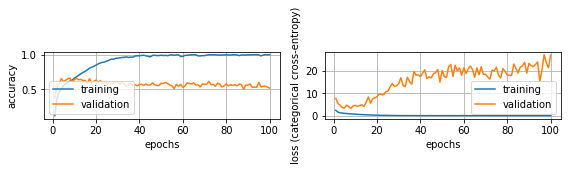

'nn_cnn_2d_mp1_min100_hog_100\\29c964743e29eb5d1192a6b7593c0d5227312967\\rec\\rec_4dbca0a3d9d7f79a0dd1020d29c20e887a324e6b_e8.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,29,0,0,0,0,1,1,0,8,3,0,0
CS,0,17,0,0,7,0,0,0,1,0,0,1
EC,0,0,26,0,0,0,3,2,8,5,0,0
ES,0,2,0,9,1,1,0,0,0,0,0,0
ESS,0,6,0,16,17,0,0,2,1,0,1,0
I,0,0,0,0,0,27,0,1,0,0,1,0
SS,0,0,2,0,1,0,23,0,1,0,0,0
T,0,5,0,3,1,1,1,18,0,4,2,2
VS,1,0,1,0,0,0,2,1,4,0,0,0
VSV,0,0,0,0,1,0,0,4,5,18,0,0


'nn_cnn_2d_mp1_min100_hog_100\\3f65cc45cb05b1b978e73f97da22556d6dd7f138\\epoch_100.h5.stats.json'

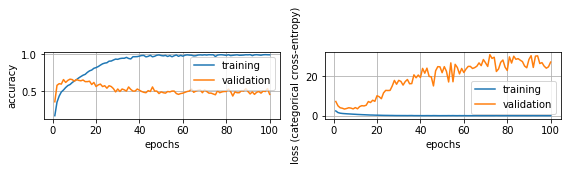

'nn_cnn_2d_mp1_min100_hog_100\\3f65cc45cb05b1b978e73f97da22556d6dd7f138\\rec\\rec_688fcd133f85edbe423ff190d1528b2d8a30d6f6_e8.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,23,0,0,0,0,0,0,0,3,0,0,0
CS,0,20,0,1,5,0,0,0,0,0,0,0
EC,2,0,25,0,0,1,3,0,4,2,0,0
ES,0,4,2,19,11,1,1,4,0,4,1,0
ESS,0,0,0,3,7,0,0,1,0,0,1,0
I,1,0,1,1,1,27,0,0,1,0,0,0
SS,0,1,0,0,1,0,25,0,6,0,0,2
T,0,3,1,3,0,0,0,10,2,0,7,2
VS,4,1,0,0,2,0,1,0,7,0,0,0
VSV,0,1,0,2,2,1,0,9,7,22,0,0


'nn_cnn_2d_mp1_min100_hog_100\\54c918d0912b44e9ca357dddbc92cae005421991\\epoch_100.h5.stats.json'

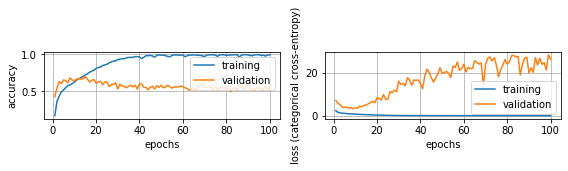

'nn_cnn_2d_mp1_min100_hog_100\\54c918d0912b44e9ca357dddbc92cae005421991\\rec\\rec_f195bf77c8e338c93a351bb1c19e3720f82c461e_e15.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,26,0,0,0,0,0,0,0,7,1,1,0
CS,0,21,0,0,10,0,0,1,0,0,0,1
EC,1,0,24,0,0,0,5,2,7,1,0,0
ES,0,3,1,19,12,2,2,2,1,1,0,0
ESS,0,1,0,2,2,0,0,0,0,0,0,0
I,0,0,1,0,1,27,0,0,0,0,0,0
SS,1,0,1,0,2,0,23,0,2,0,0,1
T,1,3,1,6,1,0,0,18,1,3,5,4
VS,1,1,0,0,0,0,0,1,7,1,0,0
VSV,0,1,2,1,1,1,0,5,5,23,0,0


'nn_cnn_2d_mp1_min100_hog_100\\587c0523340d6e498a3b715dbf565a44d1a3991c\\epoch_100.h5.stats.json'

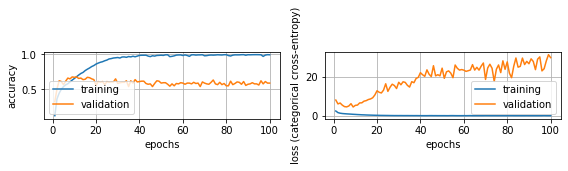

'nn_cnn_2d_mp1_min100_hog_100\\587c0523340d6e498a3b715dbf565a44d1a3991c\\rec\\rec_58816dff6d04633d364fa26d5d6dd9f2618dc027_e9.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,28,0,0,0,0,0,0,0,5,0,0,0
CS,0,15,0,1,3,0,0,0,0,0,0,2
EC,1,0,25,0,0,1,2,0,3,2,0,0
ES,0,3,0,8,8,0,0,3,1,1,1,0
ESS,0,5,0,13,11,0,0,2,1,0,2,1
I,1,0,1,2,0,29,0,0,1,0,0,0
SS,0,2,1,0,2,0,26,1,5,1,0,0
T,0,3,1,6,3,0,0,11,2,0,7,0
VS,0,0,1,0,2,0,2,1,6,0,0,0
VSV,0,1,0,0,0,0,0,7,6,25,0,1


'nn_cnn_2d_mp1_min100_hog_100\\954e253698771ed02fe8332935c4be9d2c731d3e\\epoch_100.h5.stats.json'

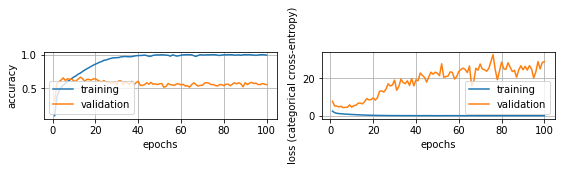

'nn_cnn_2d_mp1_min100_hog_100\\954e253698771ed02fe8332935c4be9d2c731d3e\\rec\\rec_89a6c9f2057281c5519d101a4fc2d2da6a0dab11_e13.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,27,0,1,1,0,0,0,0,5,0,0,0
CS,0,19,0,0,7,0,0,0,0,0,0,1
EC,0,0,27,0,0,0,0,0,4,3,0,0
ES,0,1,0,19,18,1,1,6,0,1,1,0
ESS,0,1,0,1,1,1,0,0,0,0,0,1
I,0,0,0,0,0,28,0,0,1,0,0,0
SS,0,2,2,1,1,0,27,2,5,1,0,1
T,1,5,0,8,2,0,1,19,2,2,11,4
VS,2,0,0,0,1,0,1,3,11,2,0,1
VSV,0,1,0,0,0,0,0,0,2,21,0,0


'nn_cnn_2d_mp1_min100_hog_100\\993c34dc4186d2d82c7155c7f14298d3d7bb37f6\\epoch_100.h5.stats.json'

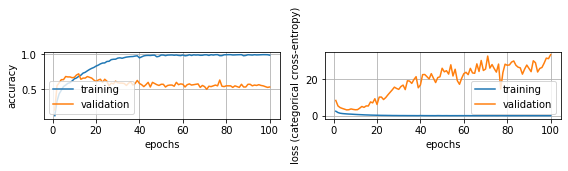

'nn_cnn_2d_mp1_min100_hog_100\\993c34dc4186d2d82c7155c7f14298d3d7bb37f6\\rec\\rec_c73cda6cc69f2e9d8ece3e8a6f7d953f0140bc5f_e12.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,25,0,0,0,0,1,0,0,5,0,0,0
CS,0,19,0,3,7,0,0,0,0,0,0,1
EC,1,0,29,0,0,0,2,1,7,5,0,0
ES,0,5,0,15,6,0,2,1,0,0,1,0
ESS,0,2,0,3,10,0,0,0,1,0,0,0
I,1,0,0,0,0,26,0,0,1,0,0,0
SS,0,0,1,0,0,0,25,0,6,0,0,0
T,0,4,0,5,2,1,0,20,2,2,1,1
VS,1,0,0,0,1,2,0,4,3,1,0,0
VSV,1,0,0,0,1,0,1,1,5,22,1,0


'nn_cnn_2d_mp1_min100_hog_100\\b965a8623c886af6ff0389370a45c3aad91d4646\\epoch_100.h5.stats.json'

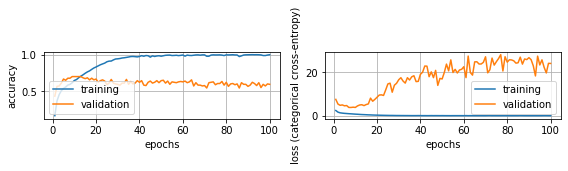

'nn_cnn_2d_mp1_min100_hog_100\\b965a8623c886af6ff0389370a45c3aad91d4646\\rec\\rec_003a46b0d766d6150d6a6f5e0d2d3126afd23585_e9.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,26,0,0,0,0,0,0,1,7,0,0,0
CS,0,22,0,1,8,0,0,0,0,0,0,0
EC,2,0,28,0,0,0,2,2,7,5,0,0
ES,0,2,0,9,5,1,2,0,0,0,1,0
ESS,0,2,0,14,16,1,0,3,1,0,0,0
I,0,0,0,0,0,27,0,0,0,0,0,0
SS,0,0,1,0,0,0,23,1,2,0,0,1
T,0,2,0,5,1,0,2,20,2,2,4,1
VS,2,0,0,0,0,1,1,2,5,0,0,0
VSV,0,1,1,0,0,0,0,1,6,23,0,0


'nn_cnn_2d_mp1_min100_hog_100\\eef188a72b93116d7974ee00d34b996d61a84222\\epoch_100.h5.stats.json'

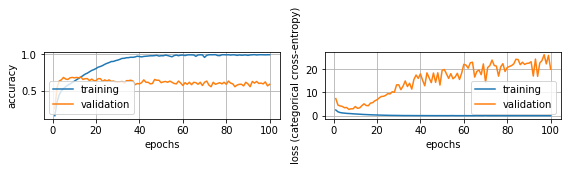

'nn_cnn_2d_mp1_min100_hog_100\\eef188a72b93116d7974ee00d34b996d61a84222\\rec\\rec_f69e396fb9fde8c10f5b44d008a8f57d8f2d7d47_e13.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,26,0,0,0,0,1,1,0,6,2,0,0
CS,0,16,0,1,4,0,0,0,0,0,0,1
EC,0,0,24,0,0,0,1,0,4,2,0,0
ES,0,7,0,21,11,0,0,1,0,0,2,0
ESS,0,1,0,2,7,0,0,0,1,0,0,0
I,1,0,0,0,0,25,0,0,1,0,0,0
SS,1,0,3,0,2,0,26,0,4,0,0,0
T,0,6,0,4,4,2,0,23,2,3,7,2
VS,1,0,1,0,0,1,2,3,4,2,0,0
VSV,0,0,1,0,1,0,0,3,7,21,0,0


'nn_cnn_1d_mp1_min100_hog_100\\29c964743e29eb5d1192a6b7593c0d5227312967\\epoch_100.h5.stats.json'

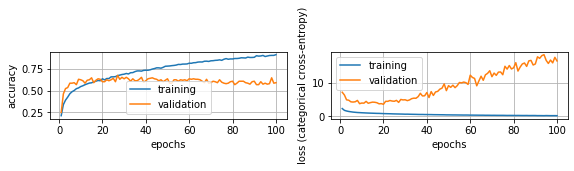

'nn_cnn_1d_mp1_min100_hog_100\\29c964743e29eb5d1192a6b7593c0d5227312967\\rec\\rec_4dbca0a3d9d7f79a0dd1020d29c20e887a324e6b_e27.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,27,1,0,0,0,0,0,0,5,2,0,0
CS,0,15,0,1,7,0,0,1,0,0,0,0
EC,1,0,20,0,0,0,0,1,1,1,0,0
ES,0,3,0,10,3,1,0,1,0,0,1,1
ESS,0,8,0,16,16,0,0,1,2,0,1,0
I,0,0,0,0,0,28,0,0,0,0,1,0
SS,0,0,2,0,1,0,28,0,1,0,0,1
T,0,3,1,2,1,0,0,20,3,2,6,5
VS,2,0,6,0,0,0,1,1,8,2,0,0
VSV,0,0,0,0,0,1,1,4,10,23,1,0


'nn_cnn_1d_mp1_min100_hog_100\\3f65cc45cb05b1b978e73f97da22556d6dd7f138\\epoch_100.h5.stats.json'

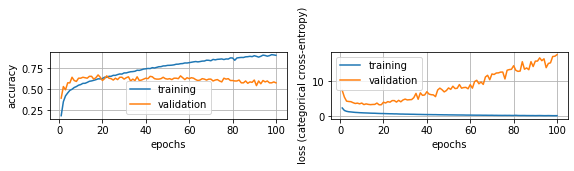

'nn_cnn_1d_mp1_min100_hog_100\\3f65cc45cb05b1b978e73f97da22556d6dd7f138\\rec\\rec_688fcd133f85edbe423ff190d1528b2d8a30d6f6_e18.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,26,0,0,0,1,0,0,0,8,0,0,0
CS,0,18,2,2,4,0,0,1,0,0,0,0
EC,1,0,21,0,0,1,3,0,2,1,0,0
ES,0,3,0,10,3,1,1,2,0,1,0,0
ESS,0,3,0,10,13,0,0,1,0,2,4,0
I,1,0,1,0,2,26,1,0,1,0,0,0
SS,0,1,0,0,1,0,22,0,5,0,0,0
T,0,2,0,3,1,0,1,11,3,0,5,1
VS,2,1,1,0,2,0,1,0,5,1,0,0
VSV,0,1,2,2,1,1,0,11,6,24,0,0


'nn_cnn_1d_mp1_min100_hog_100\\54c918d0912b44e9ca357dddbc92cae005421991\\epoch_100.h5.stats.json'

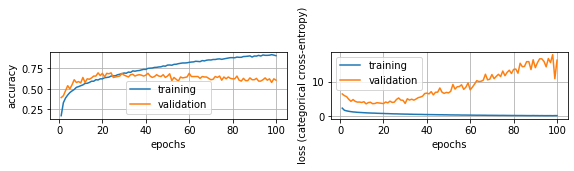

'nn_cnn_1d_mp1_min100_hog_100\\54c918d0912b44e9ca357dddbc92cae005421991\\rec\\rec_f195bf77c8e338c93a351bb1c19e3720f82c461e_e18.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,29,1,0,0,0,0,0,0,6,1,0,0
CS,0,17,1,1,5,0,0,2,0,0,0,3
EC,0,0,22,0,0,0,2,2,6,3,0,0
ES,0,1,1,8,5,1,1,2,1,0,0,0
ESS,0,6,0,14,13,0,0,0,0,1,2,3
I,0,0,1,0,2,27,1,0,0,2,1,0
SS,0,0,1,0,1,0,25,0,4,0,0,0
T,0,3,0,4,1,1,0,16,1,2,7,2
VS,1,1,3,0,1,0,1,0,7,2,0,0
VSV,0,1,1,1,0,1,0,6,5,19,0,0


'nn_cnn_1d_mp1_min100_hog_100\\587c0523340d6e498a3b715dbf565a44d1a3991c\\epoch_100.h5.stats.json'

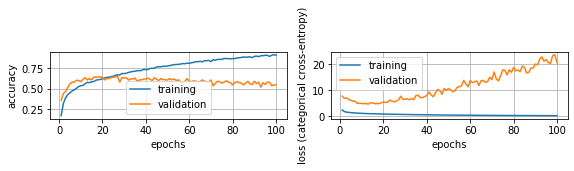

'nn_cnn_1d_mp1_min100_hog_100\\587c0523340d6e498a3b715dbf565a44d1a3991c\\rec\\rec_58816dff6d04633d364fa26d5d6dd9f2618dc027_e19.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,26,0,0,1,0,0,0,0,4,0,0,0
CS,0,18,0,1,5,0,0,0,0,1,0,1
EC,1,0,28,0,0,1,1,1,5,4,0,0
ES,0,4,0,12,6,0,0,1,0,0,1,0
ESS,0,1,0,11,12,0,0,6,1,0,2,1
I,1,0,0,0,0,28,0,0,1,0,0,0
SS,0,3,0,0,2,0,27,1,2,1,0,0
T,0,3,0,4,3,0,1,15,1,2,11,2
VS,2,0,0,0,2,1,1,0,10,2,0,1
VSV,0,1,2,1,0,0,0,5,6,20,0,0


'nn_cnn_1d_mp1_min100_hog_100\\954e253698771ed02fe8332935c4be9d2c731d3e\\epoch_100.h5.stats.json'

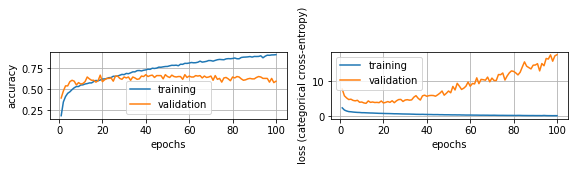

'nn_cnn_1d_mp1_min100_hog_100\\954e253698771ed02fe8332935c4be9d2c731d3e\\rec\\rec_89a6c9f2057281c5519d101a4fc2d2da6a0dab11_e40.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,29,0,0,0,0,0,0,0,3,0,1,1
CS,0,18,0,3,8,0,0,0,0,0,0,2
EC,0,0,26,0,0,0,1,0,3,3,0,0
ES,0,4,0,19,9,1,0,2,0,0,0,0
ESS,0,1,0,1,8,1,0,3,1,0,0,0
I,0,0,0,0,0,28,0,0,0,0,0,0
SS,0,3,2,0,1,0,28,2,7,0,0,2
T,0,3,0,6,3,0,0,18,1,2,10,2
VS,1,0,0,0,1,0,1,1,9,0,0,1
VSV,0,1,2,1,0,0,0,2,6,25,1,0


'nn_cnn_1d_mp1_min100_hog_100\\993c34dc4186d2d82c7155c7f14298d3d7bb37f6\\epoch_100.h5.stats.json'

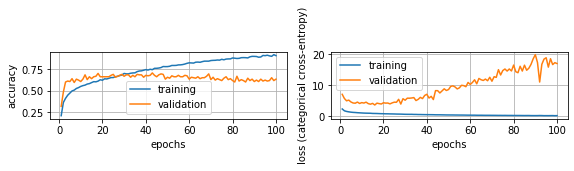

'nn_cnn_1d_mp1_min100_hog_100\\993c34dc4186d2d82c7155c7f14298d3d7bb37f6\\rec\\rec_c73cda6cc69f2e9d8ece3e8a6f7d953f0140bc5f_e43.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,24,0,0,0,0,0,0,0,5,0,0,0
CS,0,18,0,0,2,0,0,0,0,0,0,0
EC,2,0,28,0,0,0,3,1,4,4,0,0
ES,0,5,0,15,11,0,2,1,1,0,0,0
ESS,0,1,0,6,13,0,0,0,2,0,0,0
I,0,0,0,0,0,27,0,0,1,0,0,0
SS,0,0,2,0,0,0,23,0,4,0,1,0
T,1,5,0,4,1,0,0,23,2,3,7,3
VS,2,0,0,0,1,2,0,2,7,1,0,0
VSV,0,0,0,0,0,0,2,3,4,21,0,0


'nn_cnn_1d_mp1_min100_hog_100\\b965a8623c886af6ff0389370a45c3aad91d4646\\epoch_100.h5.stats.json'

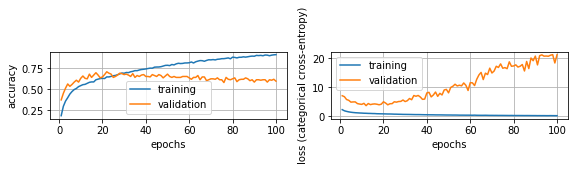

'nn_cnn_1d_mp1_min100_hog_100\\b965a8623c886af6ff0389370a45c3aad91d4646\\rec\\rec_003a46b0d766d6150d6a6f5e0d2d3126afd23585_e22.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,27,0,1,0,0,0,0,0,9,0,0,0
CS,0,18,0,1,11,0,0,0,0,0,0,0
EC,1,0,27,0,0,0,2,2,2,5,0,0
ES,0,3,0,6,1,1,0,1,0,0,0,0
ESS,0,6,0,19,14,1,0,2,1,0,1,0
I,0,0,0,0,0,27,0,0,0,0,0,0
SS,0,0,1,1,1,0,27,2,4,1,0,1
T,0,2,0,2,1,0,0,16,1,1,2,0
VS,2,0,0,0,0,1,0,1,6,1,0,0
VSV,0,0,1,0,0,0,1,4,7,22,0,1


'nn_cnn_1d_mp1_min100_hog_100\\eef188a72b93116d7974ee00d34b996d61a84222\\epoch_100.h5.stats.json'

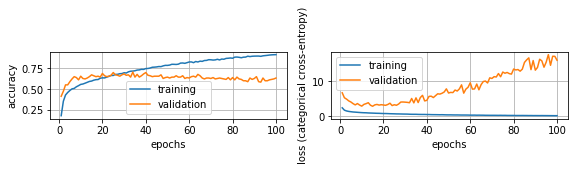

'nn_cnn_1d_mp1_min100_hog_100\\eef188a72b93116d7974ee00d34b996d61a84222\\rec\\rec_f69e396fb9fde8c10f5b44d008a8f57d8f2d7d47_e34.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,27,0,0,0,0,0,1,0,6,1,0,0
CS,0,15,0,0,6,0,0,1,0,0,0,1
EC,1,0,28,0,0,0,3,1,5,3,0,0
ES,1,6,0,21,8,0,0,2,0,0,2,0
ESS,0,3,0,4,10,0,1,0,0,0,0,0
I,0,0,0,0,0,27,0,0,1,0,0,0
SS,0,0,1,1,1,0,23,0,3,0,0,0
T,1,6,0,0,2,0,0,16,3,3,11,2
VS,0,0,1,0,2,1,2,4,4,3,0,0
VSV,0,0,0,0,1,2,0,6,8,20,0,0


'nn_cnn_2d_mp1_min100_hog_100_3d\\29c964743e29eb5d1192a6b7593c0d5227312967\\epoch_100.h5.stats.json'

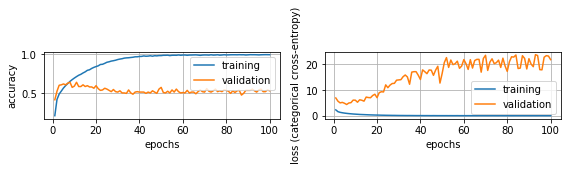

'nn_cnn_2d_mp1_min100_hog_100_3d\\29c964743e29eb5d1192a6b7593c0d5227312967\\rec\\rec_4dbca0a3d9d7f79a0dd1020d29c20e887a324e6b_e8.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,29,1,1,0,0,0,3,0,7,4,0,0
CS,0,14,0,1,8,0,0,0,1,0,0,2
EC,0,0,22,0,0,0,0,2,3,0,0,0
ES,0,3,0,11,4,0,0,0,0,0,1,0
ESS,0,7,0,9,11,0,0,1,0,0,0,1
I,0,1,0,0,0,27,0,1,0,0,0,0
SS,0,0,4,1,1,1,26,1,6,2,0,2
T,0,4,0,5,4,1,0,19,1,3,4,2
VS,1,0,2,0,0,1,1,2,7,4,0,1
VSV,0,0,0,1,1,0,0,4,4,15,0,0


'nn_cnn_2d_mp1_min100_hog_100_3d\\3f65cc45cb05b1b978e73f97da22556d6dd7f138\\epoch_100.h5.stats.json'

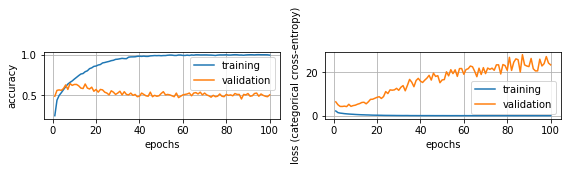

'nn_cnn_2d_mp1_min100_hog_100_3d\\3f65cc45cb05b1b978e73f97da22556d6dd7f138\\rec\\rec_688fcd133f85edbe423ff190d1528b2d8a30d6f6_e8.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,25,0,0,0,0,0,0,0,4,0,0,0
CS,0,8,0,0,3,0,0,0,0,0,1,2
EC,0,0,19,0,0,1,2,1,2,0,0,0
ES,0,9,1,15,5,0,0,2,0,2,0,1
ESS,0,7,0,9,9,0,0,0,0,0,2,0
I,1,0,1,0,2,26,0,0,1,0,0,0
SS,0,1,2,0,2,0,27,0,6,1,0,1
T,0,3,1,3,1,1,0,12,2,2,15,3
VS,4,1,3,0,2,0,1,0,11,0,0,0
VSV,0,1,2,1,2,1,0,13,4,24,0,0


'nn_cnn_2d_mp1_min100_hog_100_3d\\54c918d0912b44e9ca357dddbc92cae005421991\\epoch_100.h5.stats.json'

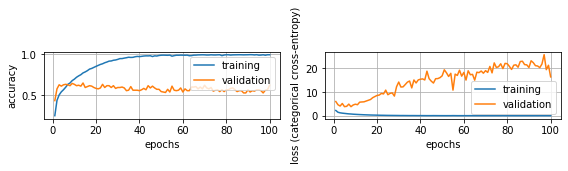

'nn_cnn_2d_mp1_min100_hog_100_3d\\54c918d0912b44e9ca357dddbc92cae005421991\\rec\\rec_f195bf77c8e338c93a351bb1c19e3720f82c461e_e14.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,27,0,0,0,0,0,0,0,7,1,0,0
CS,0,15,0,0,8,0,0,0,0,1,0,1
EC,0,0,18,0,0,0,1,1,5,0,0,0
ES,0,10,1,22,9,1,0,2,1,2,0,2
ESS,0,1,0,3,5,0,0,0,0,0,0,0
I,0,0,3,0,2,26,0,1,0,1,0,0
SS,0,0,2,0,1,0,26,0,2,0,0,3
T,0,2,1,4,0,3,1,21,1,2,11,9
VS,3,1,4,1,1,0,2,0,10,4,0,0
VSV,0,1,1,0,2,0,0,5,4,19,0,0


'nn_cnn_2d_mp1_min100_hog_100_3d\\587c0523340d6e498a3b715dbf565a44d1a3991c\\epoch_100.h5.stats.json'

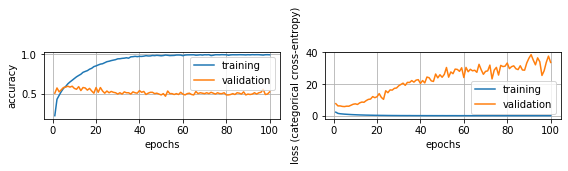

'nn_cnn_2d_mp1_min100_hog_100_3d\\587c0523340d6e498a3b715dbf565a44d1a3991c\\rec\\rec_58816dff6d04633d364fa26d5d6dd9f2618dc027_e7.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,28,0,0,0,1,0,1,0,5,0,0,0
CS,0,17,0,3,5,0,0,0,0,0,0,2
EC,1,0,25,0,0,1,0,1,6,6,0,0
ES,0,2,0,13,6,0,0,1,1,3,0,0
ESS,0,4,0,7,12,0,0,0,0,0,1,1
I,1,0,0,0,0,28,1,0,1,0,0,0
SS,0,3,1,0,1,0,25,1,6,0,0,0
T,0,2,0,3,1,0,0,18,2,3,8,1
VS,0,0,2,0,1,0,2,2,5,2,0,0
VSV,0,1,0,1,0,0,0,3,3,15,2,1


'nn_cnn_2d_mp1_min100_hog_100_3d\\954e253698771ed02fe8332935c4be9d2c731d3e\\epoch_100.h5.stats.json'

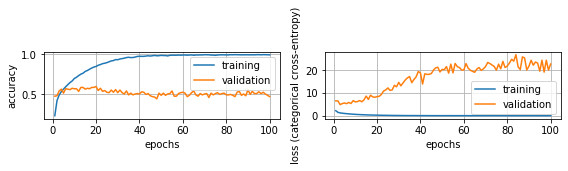

'nn_cnn_2d_mp1_min100_hog_100_3d\\954e253698771ed02fe8332935c4be9d2c731d3e\\rec\\rec_89a6c9f2057281c5519d101a4fc2d2da6a0dab11_e20.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,29,0,0,0,0,1,0,0,5,0,1,0
CS,0,8,0,0,4,0,0,0,0,0,0,0
EC,0,0,22,0,0,0,0,0,0,4,0,0
ES,0,16,0,22,18,1,1,3,1,1,0,0
ESS,0,0,0,2,3,1,0,0,0,0,0,2
I,0,0,0,0,1,27,0,0,0,0,0,0
SS,0,4,4,0,2,0,28,2,5,1,1,2
T,0,1,2,6,1,0,1,21,6,5,14,8
VS,1,0,2,0,1,0,0,2,9,3,0,1
VSV,0,1,0,0,0,0,0,2,3,16,0,1


'nn_cnn_2d_mp1_min100_hog_100_3d\\993c34dc4186d2d82c7155c7f14298d3d7bb37f6\\epoch_100.h5.stats.json'

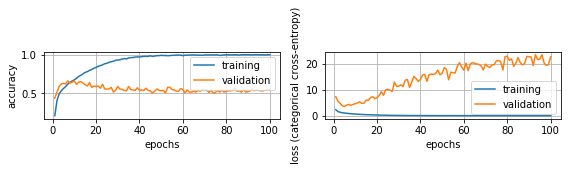

'nn_cnn_2d_mp1_min100_hog_100_3d\\993c34dc4186d2d82c7155c7f14298d3d7bb37f6\\rec\\rec_c73cda6cc69f2e9d8ece3e8a6f7d953f0140bc5f_e7.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,24,0,0,0,0,0,0,0,5,0,0,0
CS,0,19,0,1,9,1,0,0,0,0,1,1
EC,0,0,26,0,0,0,2,1,5,5,1,0
ES,2,7,0,15,9,1,2,1,1,0,0,0
ESS,0,1,0,6,5,0,0,0,1,0,0,0
I,0,0,0,0,0,24,0,0,0,0,0,0
SS,2,0,3,1,0,0,24,0,7,0,1,0
T,0,3,0,3,2,1,1,19,2,3,4,9
VS,1,0,1,0,1,3,1,2,5,4,0,0
VSV,0,0,0,0,0,0,0,4,4,18,0,0


'nn_cnn_2d_mp1_min100_hog_100_3d\\b965a8623c886af6ff0389370a45c3aad91d4646\\epoch_100.h5.stats.json'

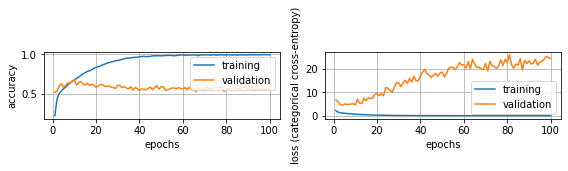

'nn_cnn_2d_mp1_min100_hog_100_3d\\b965a8623c886af6ff0389370a45c3aad91d4646\\rec\\rec_003a46b0d766d6150d6a6f5e0d2d3126afd23585_e10.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,26,0,0,0,0,1,0,1,7,0,0,0
CS,0,14,1,0,6,0,0,0,0,0,0,0
EC,2,0,27,0,0,0,0,2,3,6,0,0
ES,0,9,0,14,12,1,0,0,0,0,0,0
ESS,0,3,0,8,10,1,0,1,1,0,1,0
I,0,0,0,0,0,25,0,0,0,0,0,0
SS,0,0,1,0,1,0,26,1,3,0,0,1
T,0,1,0,3,0,0,2,16,1,1,3,3
VS,2,0,1,0,0,2,1,0,7,1,0,0
VSV,0,1,0,0,0,0,0,4,8,20,0,1


'nn_cnn_2d_mp1_min100_hog_100_3d\\eef188a72b93116d7974ee00d34b996d61a84222\\epoch_100.h5.stats.json'

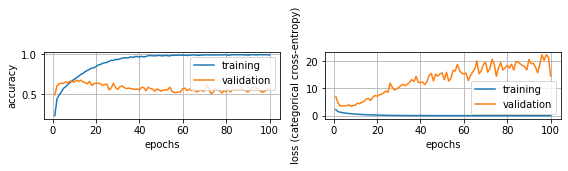

'nn_cnn_2d_mp1_min100_hog_100_3d\\eef188a72b93116d7974ee00d34b996d61a84222\\rec\\rec_f69e396fb9fde8c10f5b44d008a8f57d8f2d7d47_e11.report'

,C1,CS,EC,ES,ESS,I,SS,T,VS,VSV,V_BS,V_W2
C1,25,0,0,0,0,0,1,0,7,1,0,0
CS,0,17,0,1,8,1,0,0,1,1,0,1
EC,0,0,20,0,0,0,1,0,2,2,0,0
ES,0,7,1,17,9,1,2,1,0,1,1,0
ESS,0,0,0,5,6,0,0,0,0,0,0,0
I,0,0,1,0,0,26,0,0,0,0,0,0
SS,0,0,2,0,1,0,22,0,4,0,0,0
T,3,5,3,5,4,0,0,23,6,7,10,8
VS,2,0,2,0,1,2,3,3,4,2,0,0
VSV,0,1,0,0,0,0,1,2,5,16,1,0


In [21]:
for id in results:
	result = results[id]
	model_kFold_path = MODELS_FOLDER / id
	statFiles = model_kFold_path.parent.parent.glob('*/*.stats.json')

	for statFile in statFiles:
		data = json.loads(read_file(statFile))

		if len(data) == 0:continue

		localStatFile = str(statFile)[len(str(MODELS_FOLDER))+1:]
		display(HTML('<h3>Result for: {0:s}<h3>'.format("/".join(localStatFile.split(os.sep)[0:2]))))
		display(localStatFile)
		fig, axes = split_acc_loss_plots(range(1, len(data) + 1),
									 [h['acc'] for h in data],
									 [h['val_acc'] for h in data],
									 [h['loss'] for h in data],
									 [h['val_loss'] for h in data])
		display(fig)
		fig.clear()
		plt.close(fig)

		reports = [json.loads(read_file(f)) for f in Path(statFile).parent.glob('rec/*.report.json')]
		for report in reports:
			display(report['id'])
			display(pd.DataFrame(report['confusion']))
